# Files & imports

In [12]:
from pandas import read_csv, DataFrame
import pandas as pd

In [13]:
#get file from data pre processing notebook. This file has all the column we need to start the data profiling phase
filepath = r'dataset/df_msg_pre_proc.csv'

file_tag = 'df_msg_pre_proc'

data = pd.read_csv(filepath, na_values="")

In [14]:
%run "dslabs_functions.py"

dslabs_functions loaded


# Load test data

In [38]:
test_data=True
#test_data=False

if test_data==True:

    data=pd.read_csv(filepath)

    # 5% sample
    data=data.sample(frac=0.05, replace=False)

    # sampled data to use in heavy analysis scripts like sparsity
    sampled_data=data.sample(frac=0.25, replace=False)


else:
    data=pd.read_csv(filepath)
    
    # sampled data to use in heavy analysis scripts like sparsity
    sampled_data=data.sample(frac=0.01, replace=False)

data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3578 entries, 60814 to 40415
Data columns (total 45 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   channel_msg                   3578 non-null   object 
 1   platform                      211 non-null    object 
 2   email_provider                1468 non-null   object 
 3   date                          3578 non-null   object 
 4   sent_at                       3578 non-null   object 
 5   is_opened                     3578 non-null   object 
 6   opened_first_time_at          502 non-null    object 
 7   opened_last_time_at           502 non-null    object 
 8   is_clicked                    3578 non-null   object 
 9   clicked_first_time_at         49 non-null     object 
 10  clicked_last_time_at          49 non-null     object 
 11  is_unsubscribed               3578 non-null   object 
 12  unsubscribed_at               152 non-null    object 
 13  is_

# Dimensionality

Understand the ratio between the number of records and variables

In [16]:
from matplotlib.pyplot import figure, savefig, show
from dslabs_functions import plot_bar_chart

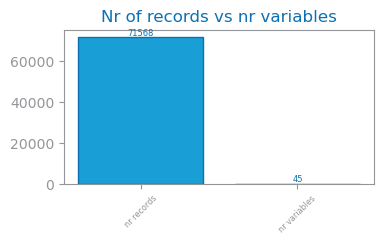

In [17]:
figure(figsize=(4, 2))
values: dict[str, int] = {"nr records": data.shape[0], "nr variables": data.shape[1]}
plot_bar_chart(
    list(values.keys()), list(values.values()), title="Nr of records vs nr variables"
)
#savefig(f"./{file_tag}_records_variables.png") #save for later step
show()

## Missing values

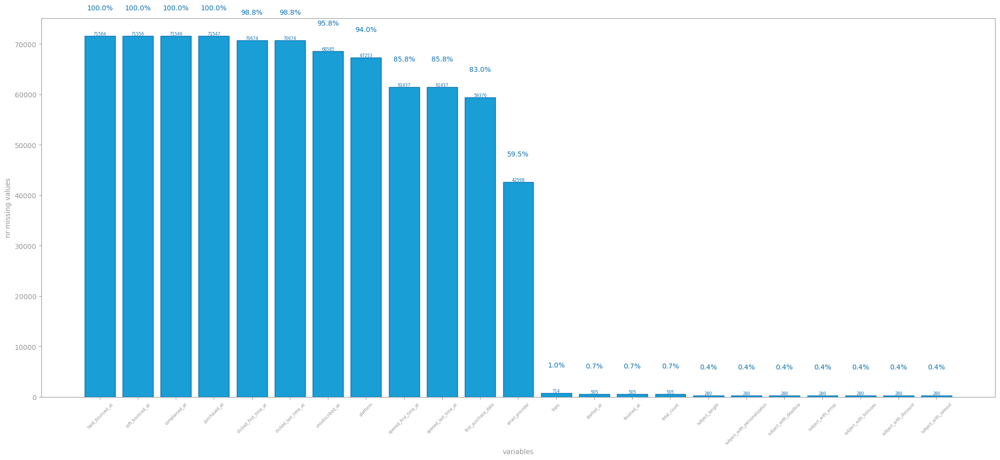

In [18]:
mv: dict[str, int] = {}
total_rows = len(data)

for var in data.columns:
    nr: int = data[var].isna().sum()
    if nr > 0:
        percentage = (nr / total_rows) * 100
        mv[var] = (nr, percentage)

sorted_mv = dict(sorted(mv.items(), key=lambda item: item[1][0], reverse=True))

variables = list(sorted_mv.keys())
missing_values = [val[0] for val in sorted_mv.values()]
percentages = [val[1] for val in sorted_mv.values()]

figure(figsize=(25, 10)) #(largura,altura) 

plot_bar_chart(
    variables,
    missing_values,
    #title="Nr of missing values per variable",
    xlabel="variables",
    ylabel="nr missing values",
)
for i, (var, perc) in enumerate(zip(variables, percentages)):
    text(i, missing_values[i] + max(missing_values) * 0.08, f"{perc:.1f}%", ha="center", va="center_baseline")

#savefig(f"./{file_tag}_mv.png")
show()

## Variables types

In [19]:
data.dtypes

channel_msg                      object
platform                         object
email_provider                   object
date                             object
sent_at                          object
is_opened                        object
opened_first_time_at             object
opened_last_time_at              object
is_clicked                       object
clicked_first_time_at            object
clicked_last_time_at             object
is_unsubscribed                  object
unsubscribed_at                  object
is_hard_bounced                  object
hard_bounced_at                  object
is_soft_bounced                  object
soft_bounced_at                  object
is_complained                    object
complained_at                    object
is_purchased                     object
purchased_at                     object
created_at                       object
updated_at                       object
first_purchase_date              object
campaign_type                    object


In [20]:
from pandas import Series, to_numeric, to_datetime


def get_variable_types(df: DataFrame) -> dict[str, list]:
    variable_types: dict = {"numeric": [], "binary": [], "date": [], "symbolic": []}

    nr_values: Series = df.nunique(axis=0, dropna=True)
    for c in df.columns:
        if 2 == nr_values[c]:
            variable_types["binary"].append(c)
            df[c].astype("bool")
        else:
        # Check if the column is already of datetime type
            if pd.api.types.is_datetime64_any_dtype(df[c]):
                variable_types["date"].append(c)
            else:
                try:
                    to_numeric(df[c], errors="raise")
                    variable_types["numeric"].append(c)
                except ValueError:
                    try:
                        df[c] = to_datetime(df[c], errors="raise")
                        variable_types["date"].append(c)
                    except ValueError:
                        variable_types["symbolic"].append(c)

    return variable_types

{'numeric': ['total_count', 'subject_length', 'week_of_month', 'day_of_week_nr', 'day_of_month', 'hour', 'min'], 'binary': ['channel_msg', 'is_opened', 'is_clicked', 'is_unsubscribed', 'is_hard_bounced', 'is_soft_bounced', 'is_complained', 'is_purchased', 'subject_with_personalization', 'subject_with_deadline', 'subject_with_emoji', 'subject_with_bonuses', 'subject_with_discount', 'subject_with_saleout', 'is_weekend', 'time_of_day'], 'date': ['date', 'sent_at', 'opened_first_time_at', 'opened_last_time_at', 'clicked_first_time_at', 'clicked_last_time_at', 'unsubscribed_at', 'hard_bounced_at', 'soft_bounced_at', 'complained_at', 'purchased_at', 'created_at', 'updated_at', 'first_purchase_date', 'started_at', 'finished_at'], 'symbolic': ['platform', 'email_provider', 'campaign_type', 'channel_cmp', 'topic', 'month']}


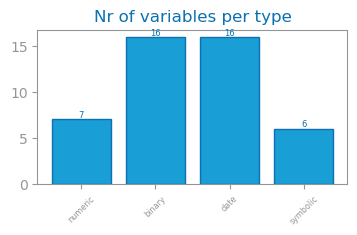

In [21]:
variable_types: dict[str, list] = get_variable_types(data)
print(variable_types)
counts: dict[str, int] = {}
for tp in variable_types.keys():
    counts[tp] = len(variable_types[tp])

figure(figsize=(4, 2))
plot_bar_chart(
    list(counts.keys()), list(counts.values()), title="Nr of variables per type"
)
#savefig(f"./{file_tag}_variable_types.png")
show()

In [22]:
# Calculate the number of distinct values for each column
distinct_counts = {var_type: {col: data[col].nunique() for col in cols} for var_type, cols in variable_types.items()}

# Print the results
for var_type, counts in distinct_counts.items():
    print(f"{var_type.capitalize()} Variables:")
    for col, count in counts.items():
        print(f"  {col}: {count} distinct values")
    print()

Numeric Variables:
  total_count: 35 distinct values
  subject_length: 27 distinct values
  week_of_month: 5 distinct values
  day_of_week_nr: 5 distinct values
  day_of_month: 18 distinct values
  hour: 10 distinct values
  min: 60 distinct values

Binary Variables:
  channel_msg: 2 distinct values
  is_opened: 2 distinct values
  is_clicked: 2 distinct values
  is_unsubscribed: 2 distinct values
  is_hard_bounced: 2 distinct values
  is_soft_bounced: 2 distinct values
  is_complained: 2 distinct values
  is_purchased: 2 distinct values
  subject_with_personalization: 2 distinct values
  subject_with_deadline: 2 distinct values
  subject_with_emoji: 2 distinct values
  subject_with_bonuses: 2 distinct values
  subject_with_discount: 2 distinct values
  subject_with_saleout: 2 distinct values
  is_weekend: 2 distinct values
  time_of_day: 2 distinct values

Date Variables:
  date: 20 distinct values
  sent_at: 35261 distinct values
  opened_first_time_at: 8720 distinct values
  opened_

# Distribution

In [23]:
summary5: DataFrame = data.describe(include="all")
summary5

,channel_msg,platform,email_provider,date,sent_at,is_opened,opened_first_time_at,opened_last_time_at,is_clicked,clicked_first_time_at,...,subject_with_discount,subject_with_saleout,week_of_month,is_weekend,day_of_week_nr,day_of_month,month,hour,min,time_of_day
count,71568,4315,28970,71568,71568,71568,10131,10131,71568,894,...,71288,71288,71568.000000,71568,71568.000000,71568.000000,71568,71568.000000,71568.000000,71568
unique,2,4,47,NaN,NaN,2,NaN,NaN,2,NaN,...,2,2,NaN,2,NaN,NaN,3,NaN,NaN,2
top,mobile_push,desktop,mail.ru,NaN,NaN,f,NaN,NaN,f,NaN,...,False,False,NaN,False,NaN,NaN,May,NaN,NaN,Morning
freq,42598,3433,17507,NaN,NaN,61437,NaN,NaN,70674,NaN,...,70977,69071,NaN,70356,NaN,NaN,53686,NaN,NaN,64224
mean,NaN,NaN,NaN,2021-05-16 12:20:06.036217344,2021-05-16 21:19:49.604208640+00:00,NaN,2021-05-17 14:12:39.939492352,2021-05-17 23:53:22.764287744,NaN,2021-05-25 19:44:09.567113984,...,NaN,NaN,2.923374,NaN,2.959675,18.380086,NaN,8.539585,26.866630,NaN
min,NaN,NaN,NaN,2021-04-30 00:00:00,2021-04-30 07:22:39+00:00,NaN,2021-04-30 07:22:44,2021-04-30 07:22:44,NaN,2021-04-30 07:46:57,...,NaN,NaN,1.000000,NaN,0.000000,3.000000,NaN,6.000000,0.000000,NaN
25%,NaN,NaN,NaN,2021-05-06 00:00:00,2021-05-06 09:33:15+00:00,NaN,2021-05-06 09:31:42.500000,2021-05-06 09:31:43.500000,NaN,2021-05-21 09:59:11.500000,...,NaN,NaN,2.000000,NaN,2.000000,12.000000,NaN,7.000000,10.000000,NaN
50%,NaN,NaN,NaN,2021-05-19 00:00:00,2021-05-19 07:56:42.500000+00:00,NaN,2021-05-20 13:00:27,2021-05-20 13:00:48,NaN,2021-05-22 10:53:14.500000,...,NaN,NaN,3.000000,NaN,3.000000,21.000000,NaN,8.000000,27.000000,NaN
75%,NaN,NaN,NaN,2021-05-24 00:00:00,2021-05-24 08:32:05.249999872+00:00,NaN,2021-05-24 08:34:01,2021-05-24 13:50:56,NaN,2021-05-27 10:23:22,...,NaN,NaN,4.000000,NaN,4.000000,27.000000,NaN,9.000000,41.000000,NaN
max,NaN,NaN,NaN,2021-06-11 00:00:00,2021-06-11 14:00:14+00:00,NaN,2021-07-29 14:18:12,2021-07-29 14:18:12,NaN,2021-07-13 10:32:39,...,NaN,NaN,5.000000,NaN,6.000000,31.000000,NaN,15.000000,59.000000,NaN


Numerical variables indiv

In [24]:
#Use a variable from the dataset - Note: i dont have numeric variables in my dataset 
var: str = "subject_length"
print(f"Summary for {var} variable:")
print("\tCount: ", summary5[var]["count"])
print("\tMean: ", summary5[var]["mean"])
print("\tStDev: ", summary5[var]["std"])
print("\tMin: ", summary5[var]["min"])
print("\tQ1: ", summary5[var]["25%"])
print("\tMedian: ", summary5[var]["50%"])
print("\tQ3: ", summary5[var]["75%"])
print("\tMax: ", summary5[var]["max"])

Summary for subject_length variable:
	Count:  71288.0
	Mean:  109.02513747054202
	StDev:  23.043903530959856
	Min:  32.0
	Q1:  97.0
	Median:  97.0
	Q3:  129.0
	Max:  185.0


Non-numerical variables indiv

In [25]:
var = "email_provider"
print(f"Summary for {var} variable:")
print("\tCount: ", summary5[var]["count"])
print("\tUnique: ", summary5[var]["unique"])
print("\tTop: ", summary5[var]["top"])
print("\tFreq: ", summary5[var]["freq"])

Summary for email_provider variable:
	Count:  28970
	Unique:  47
	Top:  mail.ru
	Freq:  17507


## Numeric variables

In [26]:
from numpy import ndarray
from matplotlib.figure import Figure
from matplotlib.pyplot import savefig, show, subplots
from dslabs_functions import define_grid, HEIGHT


Fixing date type as numeric

In [27]:
#date_columns = ['date', 'sent_at', "opened_first_time_at", "opened_last_time_at", "clicked_first_time_at", "clicked_last_time_at",
#                "unsubscribed_at", "hard_bounced_at", "soft_bounced_at", "complained_at", "blocked_at", "purchased_at", "created_at",
#                  "updated_at", "first_purchase_date", "started_at", "finished_at"]
#
## Convert all listed columns to datetime
#for col in date_columns:
#    data[col] = pd.to_datetime(data[col], errors='coerce')


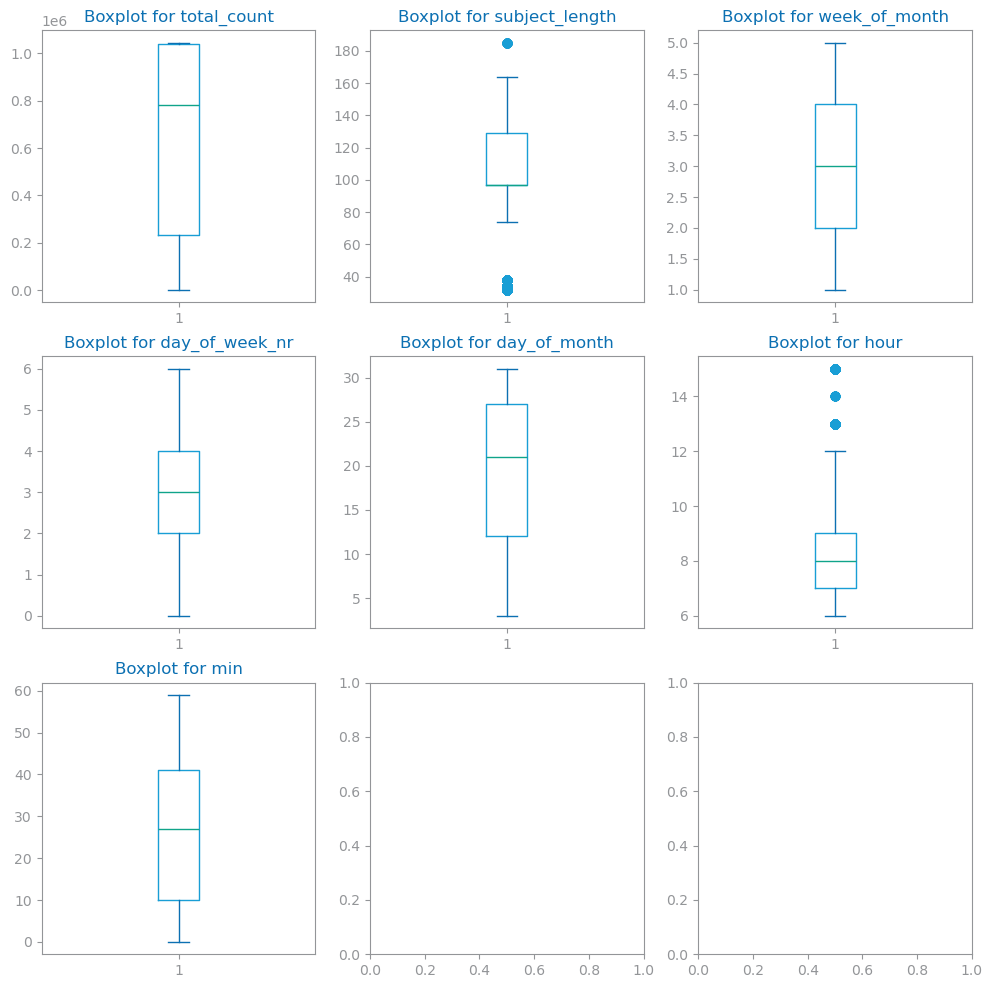

In [28]:

numeric: list[str] = variable_types["numeric"]

if [] != numeric:
    rows: int
    cols: int
    rows, cols = define_grid(len(numeric))
    fig: Figure
    axs: ndarray
    fig, axs = subplots(
        rows, cols, figsize=(cols * HEIGHT, rows * HEIGHT), squeeze=False
    )
    i, j = 0, 0
    for n in range(len(numeric)):
        axs[i, j].set_title("Boxplot for %s" % numeric[n])
        axs[i, j].boxplot(data[numeric[n]].dropna().values)
        i, j = (i + 1, 0) if (n + 1) % cols == 0 else (i, j + 1)
    #savefig(f"./{file_tag}_single_boxplots.png")
    show()
else:
    print("There are no numeric variables.")

## Outliers

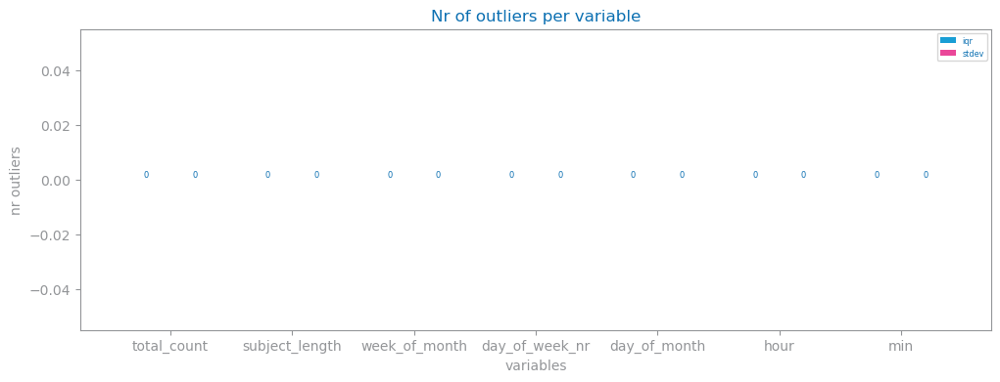

In [29]:
import numpy as np
from pandas import Series, DataFrame
from matplotlib.pyplot import figure, savefig, show
from dslabs_functions import plot_multibar_chart

NR_STDEV: int = 2
IQR_FACTOR: float = 1.5


def determine_outlier_thresholds_for_var(
    summary5: Series, std_based: bool = True, threshold: float = NR_STDEV
) -> tuple[float, float]:
    top: float = 0
    bottom: float = 0
    
    if std_based:
        # Check for NaN or NaT before doing the calculation
        if pd.isna(summary5["mean"]) or pd.isna(summary5["std"]):
            return np.nan, np.nan
        std: float = threshold * summary5["std"]
        top = summary5["mean"] + std
        bottom = summary5["mean"] - std
    else:
        if pd.isna(summary5["75%"]) or pd.isna(summary5["25%"]):
            return np.nan, np.nan
        iqr: float = threshold * (summary5["75%"] - summary5["25%"])
        top = summary5["75%"] + iqr
        bottom = summary5["25%"] - iqr

    return top, bottom


def count_outliers(
    data: DataFrame,
    numeric: list[str],
    nrstdev: int = NR_STDEV,
    iqrfactor: float = IQR_FACTOR,
) -> dict:
    outliers_iqr: list = []
    outliers_stdev: list = []
    valid_numeric: list = []  # This will store only the variables with valid outlier counts
    summary5: DataFrame = data[numeric].describe()

    for var in numeric:
        top: float
        bottom: float
        
        # Check if we can compute std-based outliers
        top, bottom = determine_outlier_thresholds_for_var(
            summary5[var], std_based=True, threshold=nrstdev
        )
        if not pd.isna(top) and not pd.isna(bottom):
            outliers_stdev_count = (
                data[data[var] > top].count()[var] + data[data[var] < bottom].count()[var]
            )
            outliers_stdev.append(outliers_stdev_count)

            # Check if we can compute IQR-based outliers
            top, bottom = determine_outlier_thresholds_for_var(
                summary5[var], std_based=False, threshold=iqrfactor
            )
            if not pd.isna(top) and not pd.isna(bottom):
                outliers_iqr_count = (
                    data[data[var] > top].count()[var] + data[data[var] < bottom].count()[var]
                )
                outliers_iqr.append(outliers_iqr_count)
                valid_numeric.append(var)  # Add to valid list if both checks pass

    return {"iqr": outliers_iqr, "stdev": outliers_stdev, "valid_numeric": valid_numeric}


if numeric:
    outliers: dict[str, int] = count_outliers(data, numeric, nrstdev=4, iqrfactor=4.5)
    
    # Use only the valid variables for which we have calculated outliers
    valid_numeric = outliers["valid_numeric"]
    
    figure(figsize=(12, HEIGHT))
    plot_multibar_chart(
        valid_numeric,  # Use only valid numeric columns
        {"iqr": outliers["iqr"], "stdev": outliers["stdev"]},  # Use valid outliers
        title="Nr of outliers per variable",
        xlabel="variables",
        ylabel="nr outliers",
        percentage=False,
    )
    # savefig(f"./{file_tag}_outliers.png")
    show()
else:
    print("There are no numeric variables.")


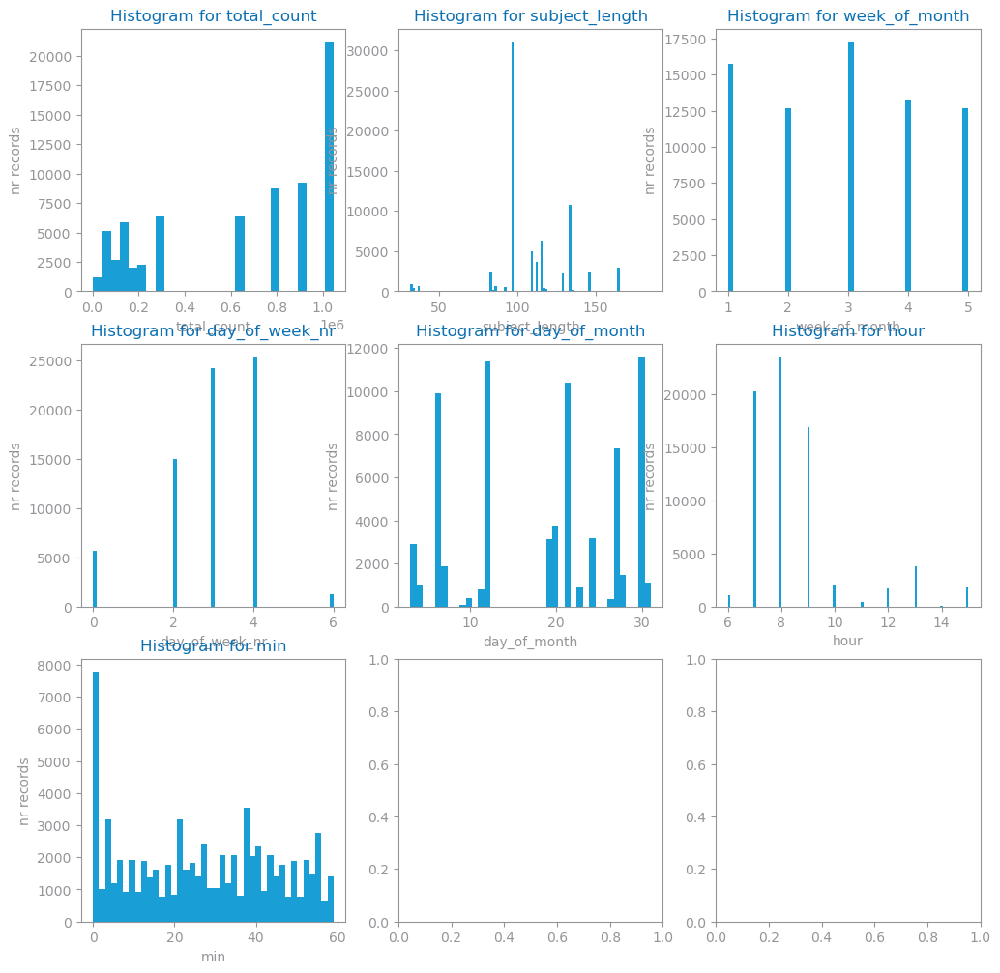

In [30]:
from dslabs_functions import set_chart_labels


if [] != numeric:
    fig, axs = subplots(
        rows, cols, figsize=(cols * HEIGHT, rows * HEIGHT), squeeze=False
    )
    i: int
    j: int
    i, j = 0, 0
    for n in range(len(numeric)):
        set_chart_labels(
            axs[i, j],
            title=f"Histogram for {numeric[n]}",
            xlabel=numeric[n],
            ylabel="nr records",
        )
        axs[i, j].hist(data[numeric[n]].dropna().values, "auto")
        i, j = (i + 1, 0) if (n + 1) % cols == 0 else (i, j + 1)
    #savefig(f"./{file_tag}_single_histograms_numeric.png")
    show()
else:
    print("There are no numeric variables.")

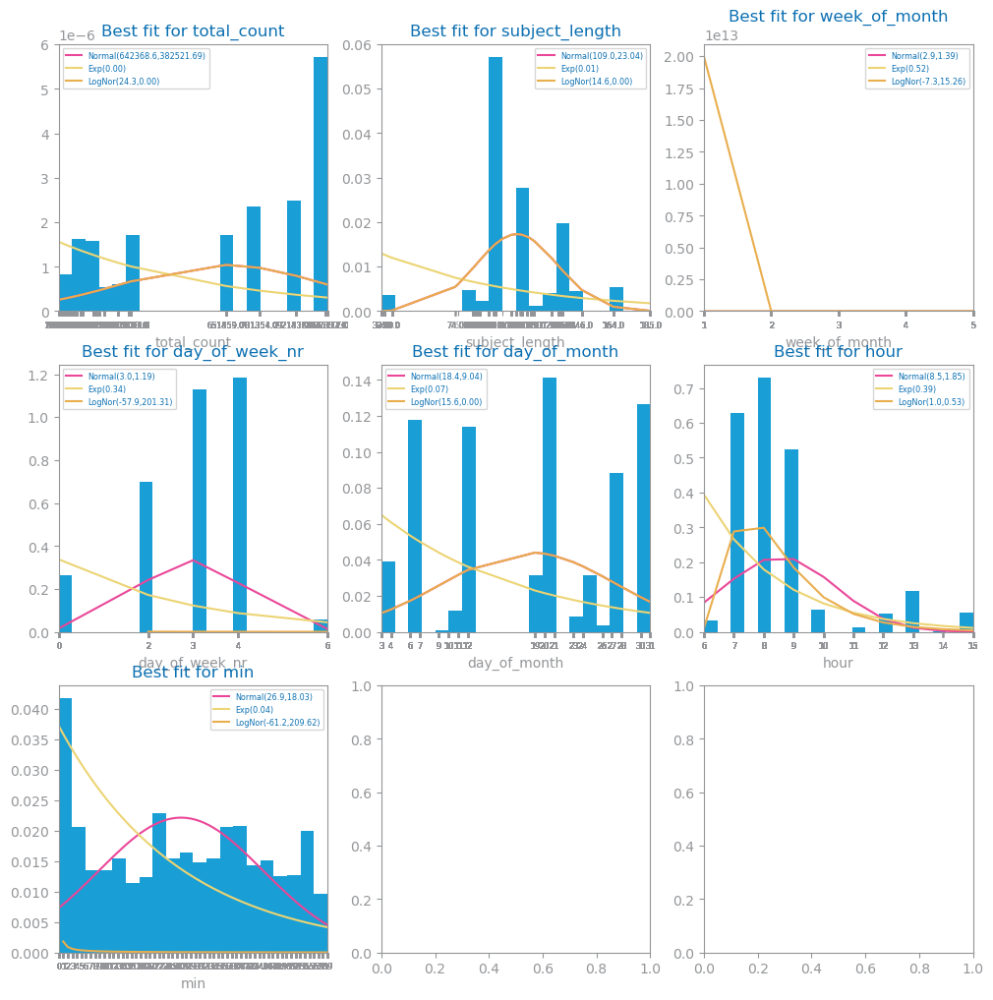

In [31]:
from numpy import log
from pandas import Series
from scipy.stats import norm, expon, lognorm
from matplotlib.axes import Axes
from dslabs_functions import plot_multiline_chart


def compute_known_distributions(x_values: list) -> dict:
    distributions = dict()
    if len(x_values) > 0:  # Check for empty list
        # Gaussian
        mean, sigma = norm.fit(x_values)
        distributions["Normal(%.1f,%.2f)" % (mean, sigma)] = norm.pdf(x_values, mean, sigma)
        # Exponential
        loc, scale = expon.fit(x_values)
        distributions["Exp(%.2f)" % (1 / scale)] = expon.pdf(x_values, loc, scale)
        # LogNorm
        sigma, loc, scale = lognorm.fit(x_values)
        distributions["LogNor(%.1f,%.2f)" % (log(scale), sigma)] = lognorm.pdf(
            x_values, sigma, loc, scale
        )
    return distributions


def histogram_with_distributions(ax: Axes, series: Series, var: str):
    values: list = series.sort_values().to_list()
    if len(values) > 0:  # Check for empty values list
        ax.hist(values, 20, density=True)
        distributions: dict = compute_known_distributions(values)
        plot_multiline_chart(
            values,
            distributions,
            ax=ax,
            title="Best fit for %s" % var,
            xlabel=var,
            ylabel="",
        )
    else:
        print(f"No data available for {var}")


if [] != numeric:
    fig, axs = subplots(
        rows, cols, figsize=(cols * HEIGHT, rows * HEIGHT), squeeze=False
    )
    i, j = 0, 0
    for n in range(len(numeric)):
        histogram_with_distributions(axs[i, j], data[numeric[n]].dropna(), numeric[n])
        i, j = (i + 1, 0) if (n + 1) % cols == 0 else (i, j + 1)
    #savefig(f"./{file_tag}_histogram_numeric_distribution.png")
    show()
else:
    print("There are no numeric variables.")


## Symbolic Variables

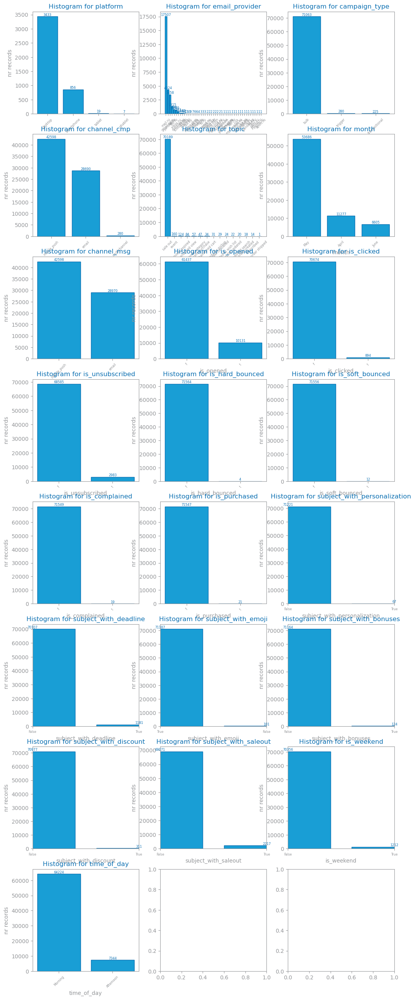

In [32]:
from numpy import ndarray
from matplotlib.figure import Figure
from matplotlib.pyplot import savefig, show, subplots
from dslabs_functions import define_grid, HEIGHT



symbolic: list[str] = variable_types["symbolic"] + variable_types["binary"]
if [] != symbolic:
    rows, cols = define_grid(len(symbolic))
    fig, axs = subplots(
        rows, cols, figsize=(cols * HEIGHT, rows * HEIGHT), squeeze=False
    )
    i, j = 0, 0
    for n in range(len(symbolic)):
        counts: Series = data[symbolic[n]].value_counts()
        plot_bar_chart(
            counts.index.to_list(),
            counts.to_list(),
            ax=axs[i, j],
            title="Histogram for %s" % symbolic[n],
            xlabel=symbolic[n],
            ylabel="nr records",
            percentage=False,
        )
        i, j = (i + 1, 0) if (n + 1) % cols == 0 else (i, j + 1)
    #savefig(f"./{file_tag}_histograms_symbolic.png")
    show()
else:
    print("There are no symbolic variables.")

## Balancing and Class distribution


Counts:
is_unsubscribed
f    68585
t     2983
Name: count, dtype: int64

Percentages:
is_unsubscribed
f    95.831936
t     4.168064
Name: count, dtype: float64


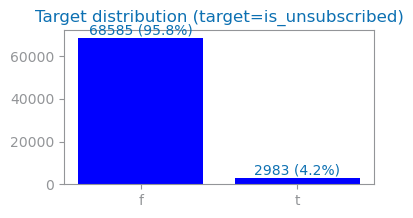

In [33]:
import matplotlib.pyplot as plt
import numpy as np

target = "is_unsubscribed"

values: Series = data[target].value_counts()
percentages: Series = (values / values.sum()) * 100  # Calculate the percentage for each category

print("Counts:")
print(values)
print("\nPercentages:")
print(percentages)

plt.figure(figsize=(4, 2))

bars = plt.bar(values.index.to_list(), values.to_list(), color='blue')

plt.title(f"Target distribution (target={target})")

for bar, p in zip(bars, percentages):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{yval} ({p:.1f}%)', ha='center', va='bottom')
# plt.savefig(f"./{file_tag}_class_distribution.png")

plt.show()


# Granularity

## Dates

In [34]:
from pandas import DataFrame
#ver para weekend, dia da semana (mon, tue, thu), hora, minuto. estudar a granularidade destas variaveis.
#variáveis ciclicas.

def derive_date_variables(data: DataFrame, date_vars: list[str]) -> DataFrame:
    for date in date_vars:
        data[date + "_year"] = data[date].dt.year
        data[date + "_quarter"] = data[date].dt.quarter
        data[date + "_month"] = data[date].dt.month
        data[date + "_day"] = data[date].dt.day
    return data

In [35]:
from pandas import Series, to_numeric, to_datetime


def get_variable_types(df: DataFrame) -> dict[str, list]:
    variable_types: dict = {"numeric": [], "binary": [], "date": [], "symbolic": []}

    nr_values: Series = df.nunique(axis=0, dropna=True)
    for c in df.columns:
        if 2 == nr_values[c]:
            variable_types["binary"].append(c)
            df[c].astype("bool")
        else:
        # Check if the column is already of datetime type
            if pd.api.types.is_datetime64_any_dtype(df[c]):
                variable_types["date"].append(c)
            else:
                try:
                    to_numeric(df[c], errors="raise")
                    variable_types["numeric"].append(c)
                except ValueError:
                    try:
                        df[c] = to_datetime(df[c], errors="raise")
                        variable_types["date"].append(c)
                    except ValueError:
                        variable_types["symbolic"].append(c)

    return variable_types

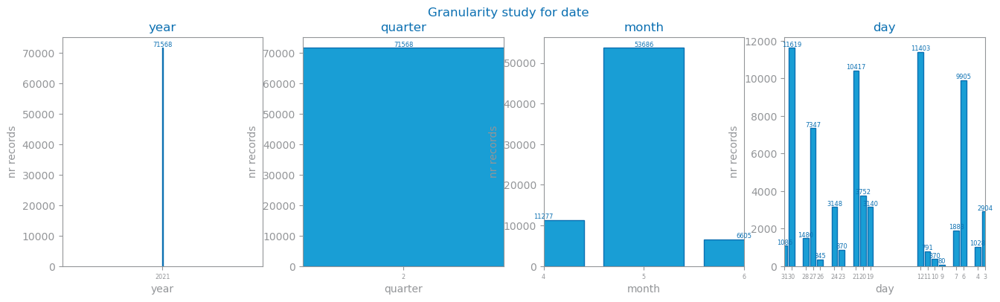

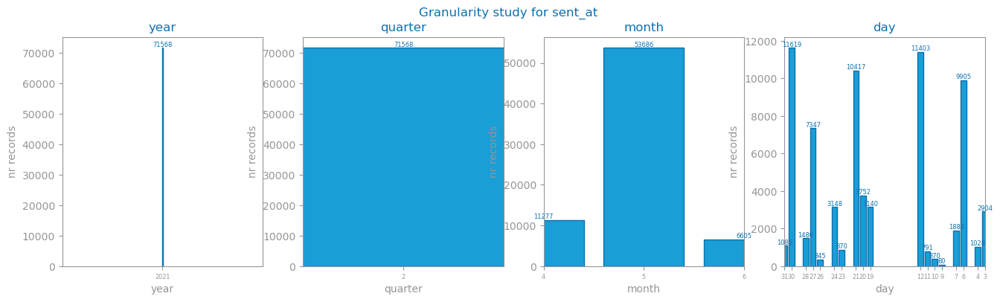

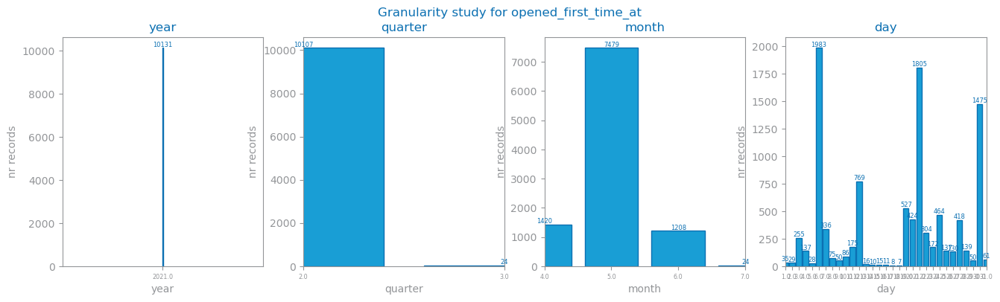

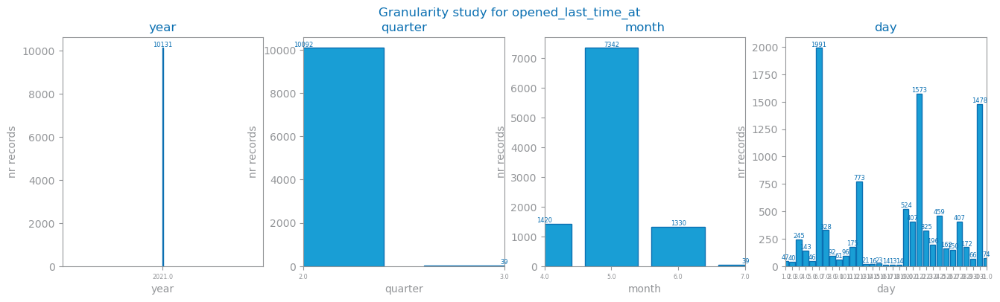

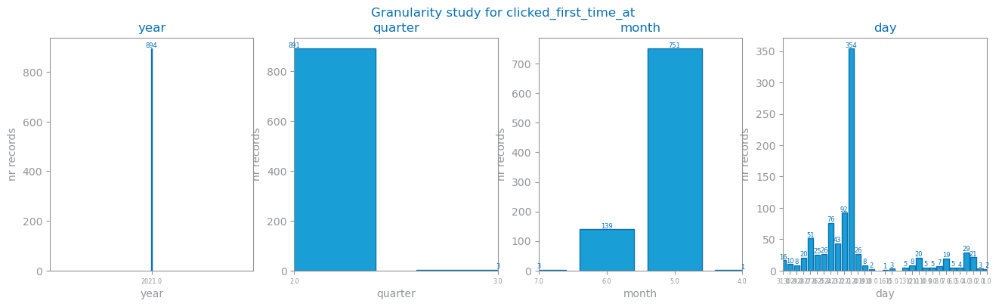

...

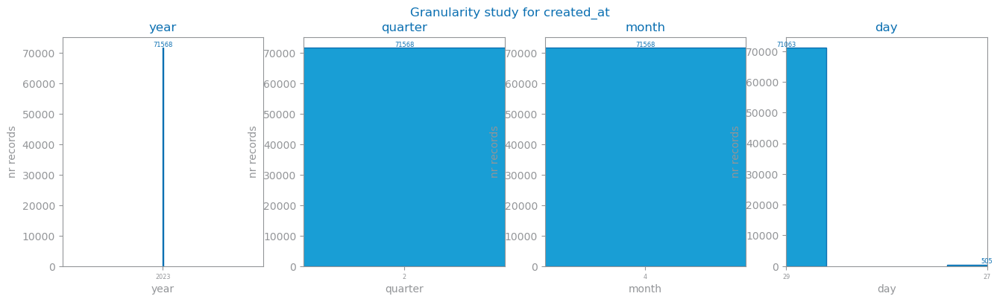

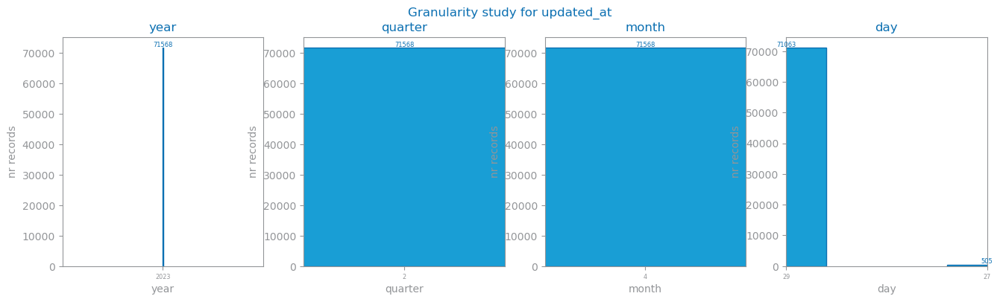

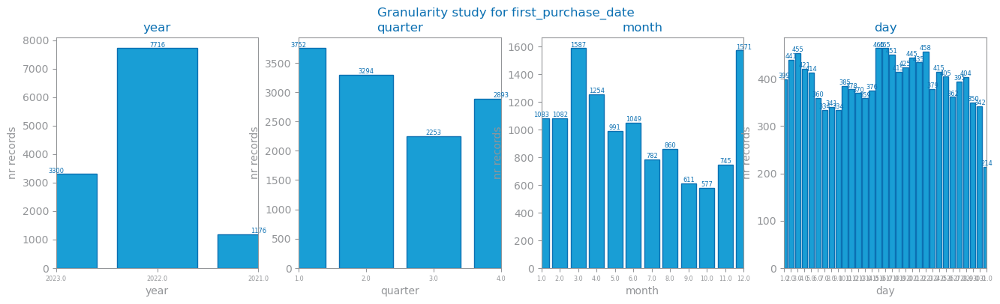

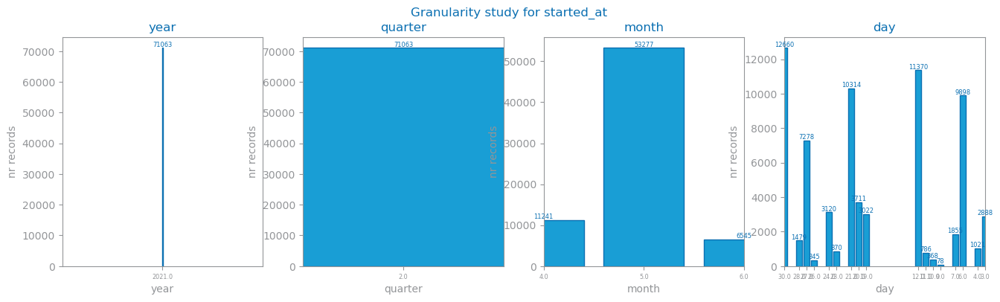

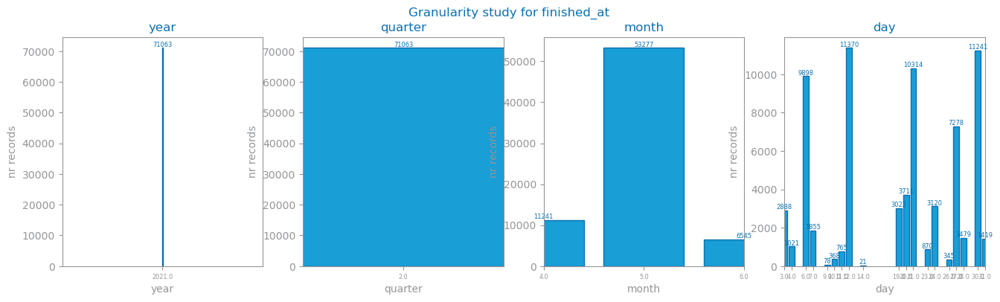

In [36]:
from numpy import ndarray
from pandas import Series, read_csv
from matplotlib.figure import Figure
from matplotlib.pyplot import subplots, savefig, show
from dslabs_functions import plot_bar_chart, HEIGHT
#get_variable_types

def analyse_date_granularity(data: DataFrame, var: str, levels: list[str]) -> ndarray:
    cols: int = len(levels)
    fig: Figure
    axs: ndarray
    fig, axs = subplots(1, cols, figsize=(cols * HEIGHT, HEIGHT), squeeze=False)
    fig.suptitle(f"Granularity study for {var}")

    for i in range(cols):
        counts: Series[int] = data[var + "_" + levels[i]].value_counts()
        plot_bar_chart(
            counts.index.to_list(),
            counts.to_list(),
            ax=axs[0, i],
            title=levels[i],
            xlabel=levels[i],
            ylabel="nr records",
            percentage=False,
        )
    return axs


data: DataFrame = read_csv(
    filepath, index_col=None, parse_dates=True, dayfirst=True
)
variables_types: dict[str, list] = get_variable_types(data)
data_ext: DataFrame = derive_date_variables(data, variables_types["date"])

for v_date in variables_types["date"]:
    analyse_date_granularity(data, v_date, ["year", "quarter", "month", "day"])
    #savefig(f"./{file_tag}_granularity_{v_date}.png")
    show()

# Sparsity
Note: scatter function is not able to deal with MV in non-numeric variables, and so we need to drop any of records having them (using the dropna method) heavy processing, use sampled data. -- use joao's sample_data in data_profiling


In [39]:
sampled_data = sampled_data.dropna()

#data = data.dropna()

vars: list = data.columns.to_list()
if [] != vars:
    target = "is_unsubscribed"

    n: int = len(vars) - 1
    fig: Figure
    axs: ndarray
    fig, axs = subplots(n, n, figsize=(n * HEIGHT, n * HEIGHT), squeeze=False)
    for i in range(len(vars)):
        var1: str = vars[i]
        for j in range(i + 1, len(vars)):
            var2: str = vars[j]
            plot_multi_scatters_chart(sampled_data, var1, var2, ax=axs[i, j - 1])
    #savefig(f"./{file_tag}_sparsity_study.png")
    show()
else:
    print("Sparsity class: there are no variables.")

Discriminate the records per class (target variable), in order to identify ranges of values specific for each class

In [40]:
if [] != vars:
    target = "is_unsubscribed"

    n: int = len(vars) - 1
    fig, axs = subplots(n, n, figsize=(n * HEIGHT, n * HEIGHT), squeeze=False)
    for i in range(len(vars)):
        var1: str = vars[i]
        for j in range(i + 1, len(vars)):
            var2: str = vars[j]
            plot_multi_scatters_chart(sampled_data, var1, var2, target, ax=axs[i, j - 1])
    #savefig(f"./{file_tag}_sparsity_per_class_study.png")
    show()
else:
    print("Sparsity per class: there are no variables.")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

# Save df from preprocessing into a csv file

In [ ]:
## Definir o caminho para salvar o arquivo CSV
#filepath = r'dataset/df_msg_data_prof.csv'
#
## Salvar o DataFrame em CSV
#data.to_csv(filepath, index=False)
#
#data.head()

# ❗️❗️Correlation analysis
Before doing this, convert all symbolic variables into numeric ones, and then compute corr matrix.
(See how in Variable Encoding Lab) 

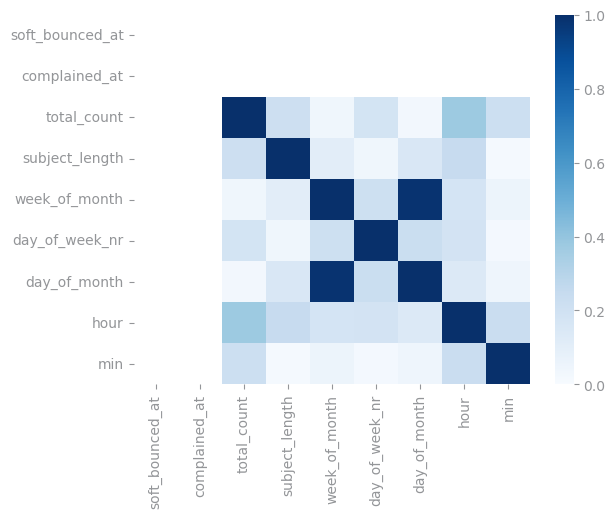

In [41]:
from seaborn import heatmap
from dslabs_functions import get_variable_types

variables_types: dict[str, list] = get_variable_types(data)
numeric: list[str] = variables_types["numeric"]
corr_mtx: DataFrame = data[numeric].corr().abs()

figure()
heatmap(
    abs(corr_mtx),
    xticklabels=numeric,
    yticklabels=numeric,
    annot=False,
    cmap="Blues",
    vmin=0,
    vmax=1,
)
#savefig(f"./{file_tag}_correlation_analysis.png")
show()